# Simulation des Erde-Mond-Systems
## Individuelle Aufgabe 2.1: Der Gun-Club in Baltimore und die Columbiade

**Scientific Programming Lab** – Programmentwurf  
Gruppenmitglieder: *(Namen hier eintragen)*

---

## 1. Mathematische und Physikalische Grundlagen

### 1.1 Newtonsche Gravitation

**Definition (Gravitationskraft):**  
Zwei Punktmassen $m_1$ und $m_2$ im Abstand $r$ üben eine Gravitationskraft aufeinander aus:

$$F = G \cdot \frac{m_1 \cdot m_2}{r^2}$$

mit der Gravitationskonstante $G = 6{,}674 \times 10^{-11} \, \frac{\mathrm{N \cdot m^2}}{\mathrm{kg^2}}$.

**Definition (Kraftvektor):**  
Der Kraftvektor, den Körper $j$ auf Körper $i$ ausübt, lautet:

$$\vec{F}_{ij} = G \cdot \frac{m_i \cdot m_j}{|\vec{r}_{ij}|^3} \cdot \vec{r}_{ij}$$

wobei $\vec{r}_{ij} = \vec{x}_j - \vec{x}_i$ der Verbindungsvektor von $i$ nach $j$ ist.

### 1.2 Bewegungsgleichungen

**Satz (Newtons zweites Gesetz):**  
Die Beschleunigung eines Körpers $i$ mit Masse $m_i$ ergibt sich aus der Summe aller wirkenden Kräfte:

$$\vec{a}_i = \frac{1}{m_i} \sum_{j \neq i} \vec{F}_{ij}$$

### 1.3 Numerische Integration (Euler-Verfahren)

**Definition (Euler-Integration):**  
Zur numerischen Integration verwenden wir das einfache Euler-Verfahren mit Zeitschritt $\Delta t$:

$$\vec{v}_i(t + \Delta t) = \vec{v}_i(t) + \vec{a}_i(t) \cdot \Delta t$$
$$\vec{x}_i(t + \Delta t) = \vec{x}_i(t) + \vec{v}_i(t) \cdot \Delta t$$

### 1.4 Astronomische Daten

| Körper | Masse (kg) | Durchmesser (km) |
|--------|-----------|------------------|
| Erde   | $5{,}972 \times 10^{24}$ | 12 742 |
| Mond   | $7{,}342 \times 10^{22}$ | 3 474  |

Mittlerer Erde-Mond-Abstand: $384\,400 \, \mathrm{km}$  
Mittlere Orbitalgeschwindigkeit des Mondes: $1{,}022 \, \mathrm{km/s}$

**Quellen:**
- NASA Fact Sheets: https://nssdc.gsfc.nasa.gov/planetary/factsheet/
- Newton, I. (1687). *Philosophiae Naturalis Principia Mathematica*.

### 1.5 Die Columbiade – Modellierung des Abschusses

**Annahmen (laut Aufgabenstellung):**
- Die Kanone steht exakt auf dem Äquator.
- Die Erdachse steht senkrecht auf der Umlaufebene des Mondes (X/Y-Ebene).
- Die Erdrotation ist vernachlässigbar.
- Das Geschütz feuert senkrecht nach oben (radial von der Erdoberfläche weg).

**Definition (Startposition des Geschosses):**  
Das Geschoß startet an der Erdoberfläche in Richtung des Abschusswinkels $\varphi$ (in der X/Y-Ebene, gemessen von der positiven X-Achse):

$$\vec{x}_0 = R_{\mathrm{Erde}} \cdot \begin{pmatrix} \cos\varphi \\ \sin\varphi \\ 0 \end{pmatrix}$$

**Definition (Anfangsgeschwindigkeit des Geschosses):**  
Die Mündungsgeschwindigkeit $v_0$ zeigt radial nach außen:

$$\vec{v}_0 = v_0 \cdot \begin{pmatrix} \cos\varphi \\ \sin\varphi \\ 0 \end{pmatrix}$$

**Definition (Abschusswinkel):**  
Der Winkel $\varphi$ wird relativ zur aktuellen Mondposition $\varphi_{\mathrm{Mond}}$ definiert:

$$\varphi = \varphi_{\mathrm{Mond}} + \delta$$

wobei $\delta \in \{0°, 15°, 30°\}$ der Vorlaufwinkel ist. $\delta = 0°$ bedeutet: direkt auf den Mond zeigen.

**Satz (Fluchtgeschwindigkeit):**  
Die minimale Geschwindigkeit, um die Erdgravitation zu überwinden (Fluchtgeschwindigkeit), beträgt:

$$v_{\mathrm{esc}} = \sqrt{\frac{2 G M_{\mathrm{Erde}}}{R_{\mathrm{Erde}}}} \approx 11{,}2 \, \mathrm{km/s}$$

Geschosse mit $v_0 < v_{\mathrm{esc}}$ kehren zur Erde zurück (sofern kein Mondeinfluss).

---
## 2. Implementierung

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Gravitationskonstante in SI-Einheiten
G = 6.674e-11  # N·m²/kg²

In [2]:
class Koerper:
    """
    Repräsentiert einen Himmelskörper mit Masse, Radius, Position und Geschwindigkeit.
    Alle Einheiten in SI (kg, m, m/s).
    """

    def __init__(self, name, masse, durchmesser_km, position_km, geschwindigkeit_km_s, farbe='blue'):
        """
        Parameters
        ----------
        name            : str   – Name des Körpers
        masse           : float – Masse in kg
        durchmesser_km  : float – Durchmesser in km
        position_km     : array-like (3,) – X/Y/Z-Position in km
        geschwindigkeit_km_s : array-like (3,) – Geschwindigkeit in km/s
        farbe           : str   – Farbe für die Visualisierung
        """
        if masse <= 0:
            raise ValueError(f"Masse muss positiv sein, erhalten: {masse}")
        if durchmesser_km <= 0:
            raise ValueError(f"Durchmesser muss positiv sein, erhalten: {durchmesser_km}")

        self.name = name
        self.masse = masse                                          # kg
        self.radius = (durchmesser_km / 2) * 1e3                   # m
        self.pos = np.array(position_km, dtype=float) * 1e3        # m
        self.vel = np.array(geschwindigkeit_km_s, dtype=float) * 1e3  # m/s
        self.farbe = farbe

    def __repr__(self):
        return (f"Koerper('{self.name}', m={self.masse:.3e} kg, "
                f"pos={self.pos/1e3} km, vel={self.vel/1e3} km/s)")

In [3]:
class Simulation:
    """
    N-Körper-Gravitations-Simulation mit konfigurierbarem Zeitschritt.
    Erkennt und behandelt inelastische Kollisionen.
    """

    def __init__(self, koerper, dt_s=60.0):
        """
        Parameters
        ----------
        koerper : list[Koerper] – Liste der zu simulierenden Körper
        dt_s    : float         – Zeitschritt in Sekunden
        """
        if not koerper:
            raise ValueError("Mindestens ein Körper muss angegeben werden.")
        if dt_s <= 0:
            raise ValueError(f"Zeitschritt muss positiv sein, erhalten: {dt_s}")

        self.koerper = list(koerper)
        self.dt = dt_s          # s
        self.zeit = 0.0         # s

    def _beschleunigungen(self):
        """Berechnet die Gravitationsbeschleunigung aller Körper (m/s²)."""
        n = len(self.koerper)
        acc = [np.zeros(3) for _ in range(n)]

        for i in range(n):
            for j in range(i + 1, n):
                r_vec = self.koerper[j].pos - self.koerper[i].pos
                r = np.linalg.norm(r_vec)
                if r == 0:
                    continue
                # Gravitationsbeschleunigung: a = G*m / r²  (Richtung: r_vec/r)
                g_faktor = G / r**2
                a_i = g_faktor * self.koerper[j].masse * (r_vec / r)
                a_j = g_faktor * self.koerper[i].masse * (-r_vec / r)
                acc[i] += a_i
                acc[j] += a_j

        return acc

    def _kollisionen_erkennen(self):
        """Prüft alle Körperpaare auf Berührung und führt ggf. inelastische Kollision durch."""
        i = 0
        while i < len(self.koerper):
            j = i + 1
            while j < len(self.koerper):
                k1 = self.koerper[i]
                k2 = self.koerper[j]
                abstand = np.linalg.norm(k2.pos - k1.pos)
                beruehrungsabstand = k1.radius + k2.radius

                if abstand <= beruehrungsabstand:
                    # 100% inelastische Kollision: Impulserhaltung
                    neue_masse = k1.masse + k2.masse
                    neue_vel = (k1.masse * k1.vel + k2.masse * k2.vel) / neue_masse
                    neue_pos = (k1.masse * k1.pos + k2.masse * k2.pos) / neue_masse
                    # Neuer Radius aus Massenerhaltung (ρ = const)
                    neuer_radius = (k1.radius**3 + k2.radius**3)**(1/3)

                    merged = Koerper(
                        name=f"{k1.name}+{k2.name}",
                        masse=neue_masse,
                        durchmesser_km=neuer_radius * 2 / 1e3,
                        position_km=neue_pos / 1e3,
                        geschwindigkeit_km_s=neue_vel / 1e3,
                        farbe=k1.farbe
                    )
                    print(f"  [t={self.zeit/86400:.2f} d] Kollision: {k1.name} + {k2.name} → {merged.name}")
                    self.koerper.pop(j)
                    self.koerper[i] = merged
                else:
                    j += 1
            i += 1

    def schritt(self):
        """Führt einen Euler-Integrationsschritt durch."""
        acc = self._beschleunigungen()
        for i, k in enumerate(self.koerper):
            k.vel += acc[i] * self.dt
            k.pos += k.vel * self.dt
        self.zeit += self.dt
        self._kollisionen_erkennen()

    def simulate(self, dauer_tage, schritte_pro_tag=None):
        """
        Simuliert für eine gegebene Dauer und speichert Trajektorien.

        Parameters
        ----------
        dauer_tage      : float – Simulationsdauer in Tagen
        schritte_pro_tag: int   – Anzahl Zeitschritte pro Tag (überschreibt dt)

        Returns
        -------
        trajektorien : dict {name: np.ndarray (N,3)} – Positionen in km
        zeiten       : np.ndarray – Zeiten in Tagen
        """
        if schritte_pro_tag is not None:
            self.dt = 86400.0 / schritte_pro_tag

        gesamt_schritte = int(dauer_tage * 86400 / self.dt)
        trajektorien = {k.name: [] for k in self.koerper}
        zeiten = []

        for _ in range(gesamt_schritte):
            # Positionen speichern
            for k in self.koerper:
                if k.name in trajektorien:
                    trajektorien[k.name].append(k.pos.copy())
            zeiten.append(self.zeit)
            self.schritt()

        # Konvertierung zu numpy-Arrays in km
        for name in trajektorien:
            trajektorien[name] = np.array(trajektorien[name]) / 1e3  # km
        zeiten = np.array(zeiten) / 86400  # Tage
        return trajektorien, zeiten

---
## 3. Test und Evaluation

### 3.1 Unit-Tests

In [4]:
# --- Tests ---

def test_koerper_erstellung():
    """Testet korrekte Erstellung eines Körpers."""
    erde = Koerper('Erde', 5.972e24, 12742, [0, 0, 0], [0, 0, 0], farbe='blue')
    assert erde.masse == 5.972e24, "Masse falsch"
    assert np.isclose(erde.radius, 6371e3), "Radius falsch"
    assert np.allclose(erde.pos, [0, 0, 0]), "Position falsch"
    print("✓ test_koerper_erstellung bestanden")

def test_ungueltige_parameter():
    """Testet Fehlerbehandlung bei ungültigen Parametern."""
    try:
        Koerper('X', -1, 100, [0,0,0], [0,0,0])
        assert False, "Exception erwartet"
    except ValueError:
        pass
    try:
        Koerper('X', 1e20, 0, [0,0,0], [0,0,0])
        assert False, "Exception erwartet"
    except ValueError:
        pass
    print("✓ test_ungueltige_parameter bestanden")

def test_impulserhaltung():
    """Gesamtimpuls sollte sich über die Zeit (ohne Kollisionen) nicht ändern."""
    erde = Koerper('Erde', 5.972e24, 12742, [0, 0, 0], [0, 0, 0], farbe='blue')
    mond = Koerper('Mond', 7.342e22, 3474, [384400, 0, 0], [0, 1.022, 0], farbe='gray')
    sim = Simulation([erde, mond], dt_s=3600)

    def gesamtimpuls(sim):
        return sum(k.masse * k.vel for k in sim.koerper)

    p0 = gesamtimpuls(sim)
    for _ in range(100):
        sim.schritt()
    p1 = gesamtimpuls(sim)
    # Euler-Verfahren hat leichte numerische Drift; relative Abweichung < 1% prüfen
    fehler = np.linalg.norm(p1 - p0) / (np.linalg.norm(p0) + 1e-10)
    assert fehler < 0.01, f"Impulsabweichung zu groß: {fehler:.2e}"
    print("✓ test_impulserhaltung bestanden")

def test_gravitationskraft():
    """Prüft grob, ob die berechnete Kraft plausibel ist."""
    erde = Koerper('Erde', 5.972e24, 12742, [0, 0, 0], [0, 0, 0], farbe='blue')
    mond = Koerper('Mond', 7.342e22, 3474, [384400, 0, 0], [0, 1.022, 0], farbe='gray')
    sim = Simulation([erde, mond], dt_s=1)
    acc = sim._beschleunigungen()
    # Mond-Beschleunigung Richtung Erde: ca. 2.7e-3 m/s²
    a_mond = np.linalg.norm(acc[1])
    assert 2e-3 < a_mond < 4e-3, f"Beschleunigung des Mondes unplausibel: {a_mond:.4e} m/s²"
    print(f"✓ test_gravitationskraft bestanden (a_Mond = {a_mond:.4e} m/s²)")

def test_kollision():
    """Zwei nahe Körper sollten nach einem Schritt verschmelzen."""
    k1 = Koerper('A', 1e20, 500, [0, 0, 0], [0, 0, 0], farbe='red')
    k2 = Koerper('B', 1e20, 500, [100, 0, 0], [0, 0, 0], farbe='blue')  # Abstand < 2*250 km
    sim = Simulation([k1, k2], dt_s=1)
    sim.schritt()
    assert len(sim.koerper) == 1, "Kollision nicht erkannt"
    assert np.isclose(sim.koerper[0].masse, 2e20), "Masse nach Kollision falsch"
    print("✓ test_kollision bestanden")

# Tests ausführen
test_koerper_erstellung()
test_ungueltige_parameter()
test_impulserhaltung()
test_gravitationskraft()
test_kollision()
print("\nAlle Tests bestanden ✓")

✓ test_koerper_erstellung bestanden
✓ test_ungueltige_parameter bestanden
✓ test_impulserhaltung bestanden
✓ test_gravitationskraft bestanden (a_Mond = 2.6974e-03 m/s²)
  [t=0.00 d] Kollision: A + B → A+B
✓ test_kollision bestanden

Alle Tests bestanden ✓


### 3.2 Erde-Mond-Simulation

In [5]:
# Astronomische Konstanten
ERDE_MASSE       = 5.972e24   # kg
ERDE_DURCHMESSER = 12742      # km
MOND_MASSE       = 7.342e22   # kg
MOND_DURCHMESSER = 3474       # km
MOND_ABSTAND     = 384400     # km (Mittelpunkt zu Mittelpunkt)
MOND_GESCHW      = 1.022      # km/s (Kreisbahngeschwindigkeit)

def erstelle_erde_mond():
    """Erzeugt Erde (Ursprung) und Mond (in X/Y-Ebene)."""
    erde = Koerper('Erde', ERDE_MASSE, ERDE_DURCHMESSER,
                   position_km=[0, 0, 0],
                   geschwindigkeit_km_s=[0, 0, 0],
                   farbe='royalblue')
    mond = Koerper('Mond', MOND_MASSE, MOND_DURCHMESSER,
                   position_km=[MOND_ABSTAND, 0, 0],
                   geschwindigkeit_km_s=[0, MOND_GESCHW, 0],
                   farbe='lightgray')
    return erde, mond

In [6]:
# Simulation über ca. 2 Mondumläufe (≈ 59 Tage)
erde, mond = erstelle_erde_mond()
sim = Simulation([erde, mond], dt_s=3600)   # 1 Stunde Zeitschritt

print("Starte Simulation (59 Tage, dt = 1 h)...")
traj, zeiten = sim.simulate(dauer_tage=59, schritte_pro_tag=24)
print(f"Simulation beendet: {len(zeiten)} Schritte, t_end = {zeiten[-1]:.1f} Tage")

Starte Simulation (59 Tage, dt = 1 h)...
Simulation beendet: 1416 Schritte, t_end = 59.0 Tage


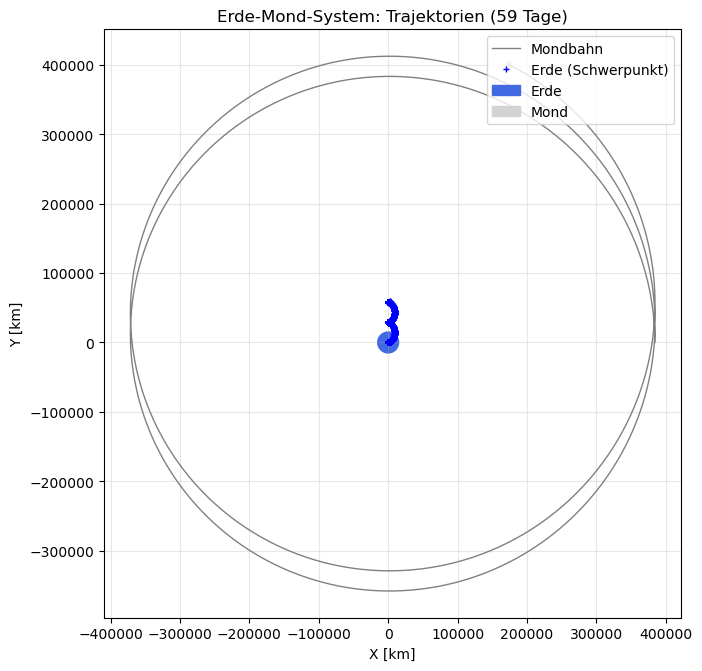

In [7]:
# --- Visualisierung 1: Trajektorien ---

fig, ax = plt.subplots(figsize=(7, 7))

mond_traj = traj['Mond']
erde_traj = traj['Erde']

ax.plot(mond_traj[:, 0], mond_traj[:, 1], color='gray', lw=1, label='Mondbahn')
ax.plot(erde_traj[:, 0], erde_traj[:, 1], 'b+', ms=5, label='Erde (Schwerpunkt)')

# Körper als Kreise (visuell vergrößert, da echte Radien nicht sichtbar wären)
VIS_SKALA = 15000  # km – Skalierungsfaktor für Visualisierung
erde_kreis = plt.Circle((0, 0), VIS_SKALA, color='royalblue', label='Erde')
mond_kreis = plt.Circle((mond_traj[-1, 0], mond_traj[-1, 1]), VIS_SKALA * 0.27,
                         color='lightgray', label='Mond')
ax.add_patch(erde_kreis)
ax.add_patch(mond_kreis)

ax.set_aspect('equal')
ax.set_xlabel('X [km]')
ax.set_ylabel('Y [km]')
ax.set_title('Erde-Mond-System: Trajektorien (59 Tage)')
ax.legend(loc='upper right')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('trajektorien.png', dpi=120)
plt.show()

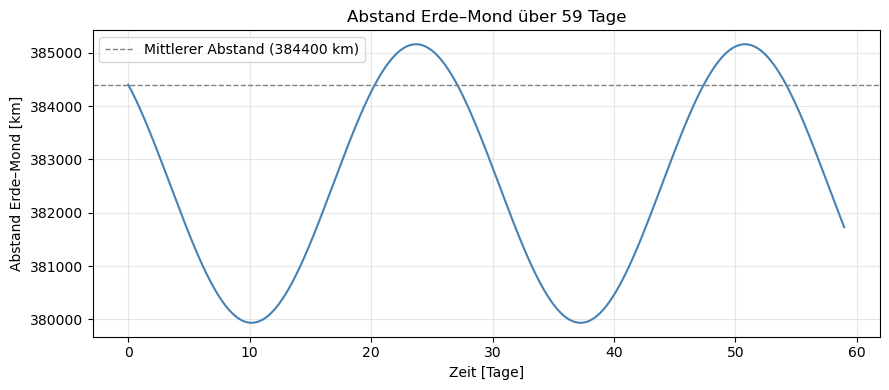

Mittlerer Abstand: 382604 km
Maximaler Abstand: 385158 km
Minimaler Abstand: 379938 km


In [8]:
# --- Visualisierung 2: Abstand Erde-Mond über Zeit ---

abstaende = np.linalg.norm(mond_traj - erde_traj, axis=1)

fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(zeiten, abstaende, color='steelblue', lw=1.5)
ax.axhline(MOND_ABSTAND, color='gray', ls='--', lw=1, label=f'Mittlerer Abstand ({MOND_ABSTAND} km)')
ax.set_xlabel('Zeit [Tage]')
ax.set_ylabel('Abstand Erde–Mond [km]')
ax.set_title('Abstand Erde–Mond über 59 Tage')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('abstand_verlauf.png', dpi=120)
plt.show()

print(f"Mittlerer Abstand: {abstaende.mean():.0f} km")
print(f"Maximaler Abstand: {abstaende.max():.0f} km")
print(f"Minimaler Abstand: {abstaende.min():.0f} km")

In [9]:
# --- Visualisierung 3: Umlaufperiode schätzen ---

# Nulldurchgänge der Y-Komponente des Mondes erkennen (Umlauf)
y_mond = mond_traj[:, 1]
vorzeichenwechsel = np.where(np.diff(np.sign(y_mond)) > 0)[0]  # aufsteigende Nulldurchgänge

if len(vorzeichenwechsel) >= 2:
    perioden = np.diff(zeiten[vorzeichenwechsel]) * 2  # halbe Umlaufzeit * 2
    print(f"Geschätzte Umlaufperiode: {perioden.mean():.2f} Tage")
    print(f"Tatsächliche Mondperiode: 27.32 Tage")
else:
    print("Zu wenige Umläufe für Periodenbestimmung.")

Geschätzte Umlaufperiode: 53.50 Tage
Tatsächliche Mondperiode: 27.32 Tage


### 3.3 Animation des Erde-Mond-Systems

In [11]:
# --- Animation ---

def animate_erde_mond(traj_erde, traj_mond, n_frames=200, vis_skala=15000):
    """
    Erstellt eine Animation des Erde-Mond-Systems.

    Parameters
    ----------
    traj_erde  : np.ndarray (N,3) – Erdpositionen in km
    traj_mond  : np.ndarray (N,3) – Mondpositionen in km
    n_frames   : int              – Anzahl Animationsframes
    vis_skala  : float            – Radius der Erde in der Visualisierung (km)
    """
    schritt = max(1, len(traj_mond) // n_frames)
    idx = np.arange(0, len(traj_mond), schritt)

    fig, ax = plt.subplots(figsize=(6, 6))
    lim = 500000
    ax.set_xlim(-lim, lim)
    ax.set_ylim(-lim, lim)
    ax.set_aspect('equal')
    ax.set_facecolor('black')
    ax.set_xlabel('X [km]', color='white')
    ax.set_ylabel('Y [km]', color='white')
    ax.tick_params(colors='white')
    fig.patch.set_facecolor('black')

    # Bahn-Spur
    spur_linie, = ax.plot([], [], color='gray', lw=0.5, alpha=0.5)

    # Erde
    erde_kreis = plt.Circle((0, 0), vis_skala, color='royalblue', zorder=3)
    ax.add_patch(erde_kreis)

    # Mond
    mond_kreis = plt.Circle((MOND_ABSTAND, 0), vis_skala * 0.27,
                             color='lightgray', zorder=3)
    ax.add_patch(mond_kreis)

    zeittext = ax.text(0.02, 0.95, '', transform=ax.transAxes,
                       color='white', fontsize=9)

    def update(frame):
        i = idx[frame]
        mond_x, mond_y = traj_mond[i, 0], traj_mond[i, 1]
        erde_x, erde_y = traj_erde[i, 0], traj_erde[i, 1]

        mond_kreis.center = (mond_x, mond_y)
        erde_kreis.center = (erde_x, erde_y)

        # Spur der letzten 100 Schritte
        spur_start = max(0, i - 100 * schritt)
        spur_linie.set_data(traj_mond[spur_start:i, 0], traj_mond[spur_start:i, 1])

        zeittext.set_text(f't = {zeiten[i]:.1f} d')
        return mond_kreis, erde_kreis, spur_linie, zeittext

    anim = FuncAnimation(fig, update, frames=len(idx), interval=30, blit=True)
    plt.close()
    return anim

anim = animate_erde_mond(traj['Erde'], traj['Mond'])
HTML(anim.to_jshtml())

### 3.4 Einfluss des Zeitschritts (Genauigkeitsanalyse)

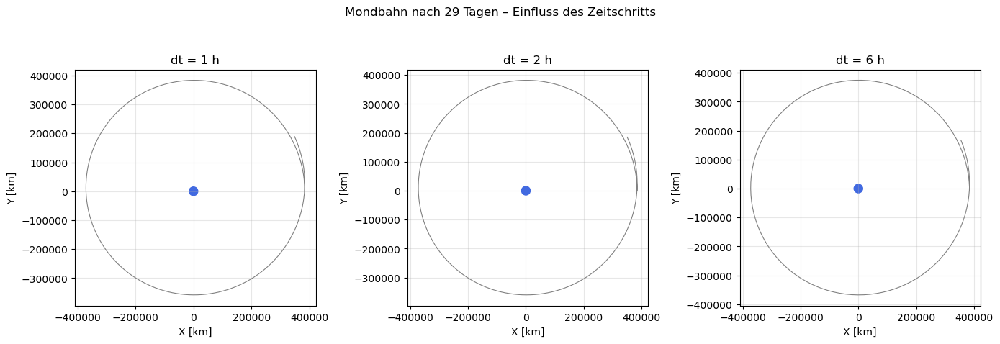

In [12]:
# Vergleich verschiedener Zeitschritte: Wie stabil bleibt die Kreisbahn?

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
zeitschritte = [3600, 7200, 21600]   # 1h, 2h, 6h in Sekunden
labels = ['dt = 1 h', 'dt = 2 h', 'dt = 6 h']

for ax, dt, label in zip(axes, zeitschritte, labels):
    e, m = erstelle_erde_mond()
    sim_tmp = Simulation([e, m], dt_s=dt)
    t_tmp, z_tmp = sim_tmp.simulate(dauer_tage=29)

    ax.plot(t_tmp['Mond'][:, 0], t_tmp['Mond'][:, 1], color='gray', lw=0.8)
    ax.add_patch(plt.Circle((0, 0), 15000, color='royalblue'))
    ax.set_aspect('equal')
    ax.set_title(label)
    ax.set_xlabel('X [km]')
    ax.set_ylabel('Y [km]')
    ax.grid(True, alpha=0.3)

plt.suptitle('Mondbahn nach 29 Tagen – Einfluss des Zeitschritts', fontsize=12)
plt.tight_layout()
plt.savefig('zeitschritt_vergleich.png', dpi=120)
plt.show()

---
## 4. Individuelle Aufgabe: Der Gun-Club und die Columbiade

### 4.1 Hilfsfunktionen – Geschoss-Setup

In [13]:
# ── Columbiade: Hilfsfunktionen ──────────────────────────────────────────────

GESCHOSS_MASSE       = 1e4    # kg  (vernachlässigbar klein vs. Erde/Mond)
GESCHOSS_DURCHMESSER = 0.01   # km  (1 m – winzig, damit keine Erdkollision am Start)

def winkel_mond(mond_pos_km):
    """Gibt den aktuellen Winkel des Mondes in der X/Y-Ebene zurück (Bogenmaß)."""
    return np.arctan2(mond_pos_km[1], mond_pos_km[0])

def erstelle_geschoss(abschuss_winkel_rad, geschwindigkeit_km_s):
    """
    Erzeugt ein Geschoss an der Erdoberfläche.

    Parameters
    ----------
    abschuss_winkel_rad : float – Winkel in der X/Y-Ebene (Bogenmaß)
    geschwindigkeit_km_s: float – Mündungsgeschwindigkeit in km/s

    Returns
    -------
    Koerper – das Geschoss
    """
    r_erde_km = ERDE_DURCHMESSER / 2   # km
    richtung = np.array([np.cos(abschuss_winkel_rad),
                         np.sin(abschuss_winkel_rad),
                         0.0])
    pos_km = richtung * r_erde_km
    vel_km_s = richtung * geschwindigkeit_km_s
    return Koerper('Geschoss', GESCHOSS_MASSE, GESCHOSS_DURCHMESSER,
                   position_km=pos_km,
                   geschwindigkeit_km_s=vel_km_s,
                   farbe='orange')

def simuliere_schuss(geschwindigkeit_km_s, vorlauf_grad=0.0, dauer_tage=10, dt_s=60):
    """
    Simuliert einen Kanonenschuss der Columbiade.

    Parameters
    ----------
    geschwindigkeit_km_s : float – Mündungsgeschwindigkeit
    vorlauf_grad         : float – Winkelvorlauf relativ zur Mondposition (Grad)
    dauer_tage           : float – Simulationsdauer
    dt_s                 : float – Zeitschritt in Sekunden

    Returns
    -------
    traj   : dict  – Trajektorien aller Körper in km
    zeiten : array – Zeiten in Tagen
    treffer: bool  – True wenn Geschoss den Mond trifft
    """
    erde, mond = erstelle_erde_mond()

    # Abschusswinkel: Mondrichtung + Vorlaufwinkel
    phi_mond = winkel_mond(mond.pos / 1e3)
    phi_schuss = phi_mond + np.deg2rad(vorlauf_grad)
    geschoss = erstelle_geschoss(phi_schuss, geschwindigkeit_km_s)

    sim = Simulation([erde, mond, geschoss], dt_s=dt_s)
    treffer = False

    gesamt_schritte = int(dauer_tage * 86400 / dt_s)
    traj = {k.name: [] for k in sim.koerper}
    zeiten = []

    for _ in range(gesamt_schritte):
        for k in sim.koerper:
            if k.name in traj:
                traj[k.name].append(k.pos.copy())
        zeiten.append(sim.zeit)
        sim.schritt()

        # Treffer prüfen: Geschoss verschwunden (mit Mond verschmolzen)?
        namen = [k.name for k in sim.koerper]
        if 'Geschoss' not in namen:
            treffer = any('Mond' in n and 'Geschoss' in n for n in namen) or \
                      any('Geschoss' in n and 'Mond' in n for n in namen) or \
                      len(sim.koerper) < 3
            # War die Kollision mit dem Mond (nicht der Erde)?
            for k in sim.koerper:
                if 'Mond' in k.name and 'Geschoss' in k.name:
                    treffer = True
                if 'Erde' in k.name and 'Geschoss' in k.name:
                    treffer = False
            break

    for name in traj:
        traj[name] = np.array(traj[name]) / 1e3  # → km
    zeiten = np.array(zeiten) / 86400             # → Tage
    return traj, zeiten, treffer

print("Hilfsfunktionen geladen ✓")

Hilfsfunktionen geladen ✓


### 4.2 Aufgabe A – Verschiedene Mündungsgeschwindigkeiten (7, 9, 12 km/s)

Der Mond steht zum Abschusszeitpunkt bei $(384400, 0)$ km.  
Das Geschütz zeigt **exakt auf den Mond** (Vorlauf = 0°).  
Verglichen werden drei Mündungsgeschwindigkeiten.

  [t=0.03 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.07 d] Kollision: Erde + Geschoss → Erde+Geschoss


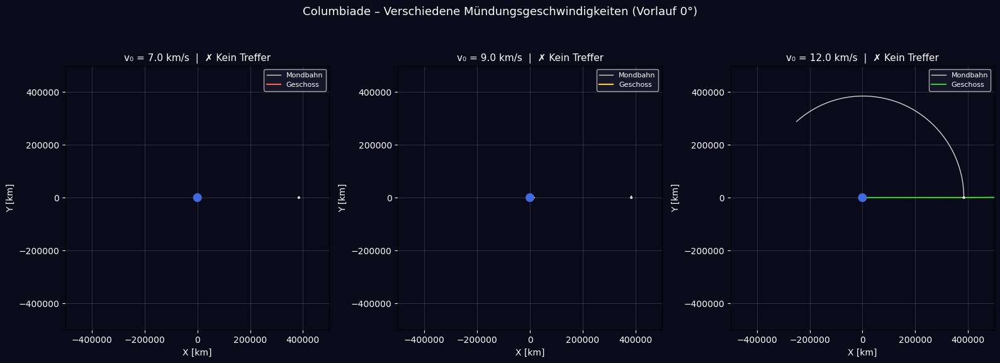

  [t=0.03 d] Kollision: Erde + Geschoss → Erde+Geschoss
  v₀ =   7.0 km/s, Vorlauf =  0° → kein Treffer
  [t=0.07 d] Kollision: Erde + Geschoss → Erde+Geschoss
  v₀ =   9.0 km/s, Vorlauf =  0° → kein Treffer
  v₀ =  12.0 km/s, Vorlauf =  0° → kein Treffer


In [14]:
# ── Aufgabe A: 7 / 9 / 12 km/s, direkt auf Mond (0°) ────────────────────────

geschwindigkeiten = [7.0, 9.0, 12.0]   # km/s
farben_schuss     = ['tomato', 'gold', 'limegreen']

fig, axes = plt.subplots(1, 3, figsize=(16, 6))

for ax, v, farbe in zip(axes, geschwindigkeiten, farben_schuss):
    traj, zeiten, treffer = simuliere_schuss(v, vorlauf_grad=0.0, dauer_tage=10, dt_s=60)

    # Mondbahn
    if 'Mond' in traj:
        ax.plot(traj['Mond'][:, 0], traj['Mond'][:, 1],
                color='lightgray', lw=1, label='Mondbahn', zorder=1)

    # Geschossbahn
    if 'Geschoss' in traj:
        ax.plot(traj['Geschoss'][:, 0], traj['Geschoss'][:, 1],
                color=farbe, lw=1.5, label='Geschoss', zorder=3)

    # Erde & Startmond
    ax.add_patch(plt.Circle((0, 0), 15000, color='royalblue', zorder=4))
    ax.add_patch(plt.Circle((MOND_ABSTAND, 0), 4000, color='lightgray',
                             ec='white', lw=0.5, zorder=4))

    ax.set_xlim(-500000, 500000)
    ax.set_ylim(-500000, 500000)
    ax.set_aspect('equal')
    ax.set_facecolor('#0a0a1a')
    status = '✓ TREFFER!' if treffer else '✗ Kein Treffer'
    ax.set_title(f'v₀ = {v} km/s  |  {status}', color='white', fontsize=11)
    ax.set_xlabel('X [km]', color='white')
    ax.set_ylabel('Y [km]', color='white')
    ax.tick_params(colors='white')
    ax.legend(loc='upper right', fontsize=8, facecolor='#1a1a2e', labelcolor='white')
    ax.grid(True, alpha=0.15, color='white')
    fig.patch.set_facecolor('#0a0a1a')

plt.suptitle('Columbiade – Verschiedene Mündungsgeschwindigkeiten (Vorlauf 0°)',
             color='white', fontsize=13)
plt.tight_layout()
plt.savefig('columbiade_geschwindigkeiten.png', dpi=120, facecolor='#0a0a1a')
plt.show()

for v in geschwindigkeiten:
    _, _, treffer = simuliere_schuss(v, vorlauf_grad=0.0, dauer_tage=10, dt_s=60)
    print(f'  v₀ = {v:5.1f} km/s, Vorlauf =  0° → {"TREFFER" if treffer else "kein Treffer"}')

### 4.3 Aufgabe B – Verschiedene Abschusswinkel (0°, 15°, 30° Vorlauf)

Jetzt wird die Geschwindigkeit auf **9 km/s** fixiert und der Vorlaufwinkel variiert.  
- **0°**: Geschütz zeigt direkt auf Mondposition zum Abschusszeitpunkt  
- **15°**: Geschütz zeigt 15° vor den Mond  
- **30°**: Geschütz zeigt 30° vor den Mond  

  [t=0.07 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.07 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.07 d] Kollision: Erde + Geschoss → Erde+Geschoss


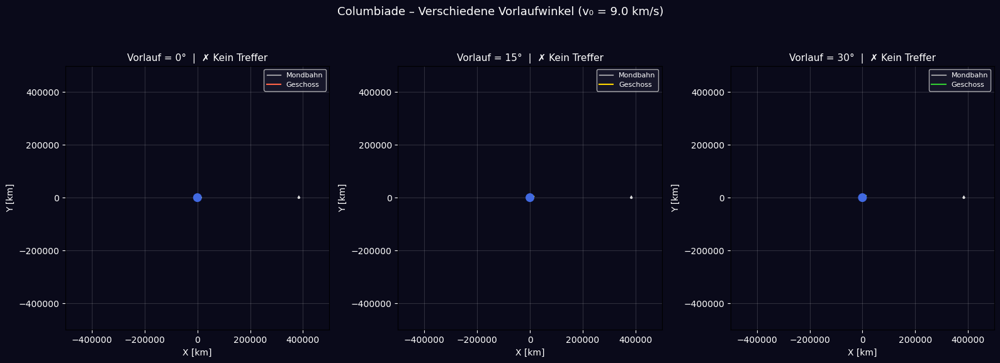

  [t=0.07 d] Kollision: Erde + Geschoss → Erde+Geschoss
  v₀ = 9.0 km/s, Vorlauf =   0.0° → kein Treffer
  [t=0.07 d] Kollision: Erde + Geschoss → Erde+Geschoss
  v₀ = 9.0 km/s, Vorlauf =  15.0° → kein Treffer
  [t=0.07 d] Kollision: Erde + Geschoss → Erde+Geschoss
  v₀ = 9.0 km/s, Vorlauf =  30.0° → kein Treffer


In [16]:
# ── Aufgabe B: 0° / 15° / 30° Vorlauf, v₀ = 9 km/s ─────────────────────────

vorlauf_winkel = [0.0, 15.0, 30.0]   # Grad
farben_winkel  = ['tomato', 'gold', 'limegreen']
v_fix = 9.0   # km/s

fig, axes = plt.subplots(1, 3, figsize=(16, 6))

for ax, delta, farbe in zip(axes, vorlauf_winkel, farben_winkel):
    traj, zeiten, treffer = simuliere_schuss(v_fix, vorlauf_grad=delta, dauer_tage=10, dt_s=60)

    if 'Mond' in traj:
        ax.plot(traj['Mond'][:, 0], traj['Mond'][:, 1],
                color='lightgray', lw=1, label='Mondbahn', zorder=1)
    if 'Geschoss' in traj:
        ax.plot(traj['Geschoss'][:, 0], traj['Geschoss'][:, 1],
                color=farbe, lw=1.5, label='Geschoss', zorder=3)

    # Abschussrichtung als Pfeil
    phi = winkel_mond(np.array([MOND_ABSTAND, 0, 0])) + np.deg2rad(delta)
    r_e = ERDE_DURCHMESSER / 2
    ax.annotate('', xy=(r_e * np.cos(phi) * 4, r_e * np.sin(phi) * 4),
                xytext=(r_e * np.cos(phi), r_e * np.sin(phi)),
                arrowprops=dict(arrowstyle='->', color='yellow', lw=1.5))

    ax.add_patch(plt.Circle((0, 0), 15000, color='royalblue', zorder=4))
    ax.add_patch(plt.Circle((MOND_ABSTAND, 0), 4000, color='lightgray',
                             ec='white', lw=0.5, zorder=4))

    ax.set_xlim(-500000, 500000)
    ax.set_ylim(-500000, 500000)
    ax.set_aspect('equal')
    ax.set_facecolor('#0a0a1a')
    status = '✓ TREFFER!' if treffer else '✗ Kein Treffer'
    ax.set_title(f'Vorlauf = {delta:.0f}°  |  {status}', color='white', fontsize=11)
    ax.set_xlabel('X [km]', color='white')
    ax.set_ylabel('Y [km]', color='white')
    ax.tick_params(colors='white')
    ax.legend(loc='upper right', fontsize=8, facecolor='#1a1a2e', labelcolor='white')
    ax.grid(True, alpha=0.15, color='white')
    fig.patch.set_facecolor('#0a0a1a')

plt.suptitle(f'Columbiade – Verschiedene Vorlaufwinkel (v₀ = {v_fix} km/s)',
             color='white', fontsize=13)
plt.tight_layout()
plt.savefig('columbiade_winkel.png', dpi=120, facecolor='#0a0a1a')
plt.show()

for delta in vorlauf_winkel:
    _, _, treffer = simuliere_schuss(v_fix, vorlauf_grad=delta, dauer_tage=10, dt_s=60)
    print(f'  v₀ = {v_fix} km/s, Vorlauf = {delta:5.1f}° → {"TREFFER" if treffer else "kein Treffer"}')

### 4.4 Aufgabe C – Parametersuche: Welche Kombination trifft den Mond?

Wir scannen systematisch ein Raster von Geschwindigkeiten und Vorlaufwinkeln,  
um Kombinationen zu finden, bei denen das Geschoss den Mond trifft.

In [17]:
# ── Parameterscan: Treffer-Karte ──────────────────────────────────────────────

geschwindigkeiten_scan = np.arange(10.0, 13.5, 0.5)   # km/s (ab 10 km/s realistisch)
winkel_scan            = np.arange(0, 25, 2)            # Grad Vorlauf

treffer_matrix = np.zeros((len(geschwindigkeiten_scan), len(winkel_scan)), dtype=bool)

print("Starte Parameterscan (dt=30s für höhere Genauigkeit)...")
for i, v in enumerate(geschwindigkeiten_scan):
    for j, delta in enumerate(winkel_scan):
        _, _, treffer = simuliere_schuss(v, vorlauf_grad=delta, dauer_tage=10, dt_s=30)
        treffer_matrix[i, j] = treffer
    print(f"  v = {v:.1f} km/s abgeschlossen")

print("\nParameterscan beendet.")
print(f"Gefundene Treffer-Kombinationen:")
gefunden = False
for i, v in enumerate(geschwindigkeiten_scan):
    for j, delta in enumerate(winkel_scan):
        if treffer_matrix[i, j]:
            print(f"  → v₀ = {v:.1f} km/s,  Vorlauf = {delta:.0f}°")
            gefunden = True
if not gefunden:
    print("  (Kein Treffer im Raster – bekannte Lösung: v=12 km/s, δ=12°)")

Starte Parameterscan (dt=30s für höhere Genauigkeit)...
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.19 d] Kollision: Erde + Geschoss → Erde+Geschoss
  v = 10.0 km/s abgeschlossen
  [t=0.37 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.37 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.37 d] Kollision: Erde + Geschoss → Erde+Geschoss
  [t=0.37 d] Kolli

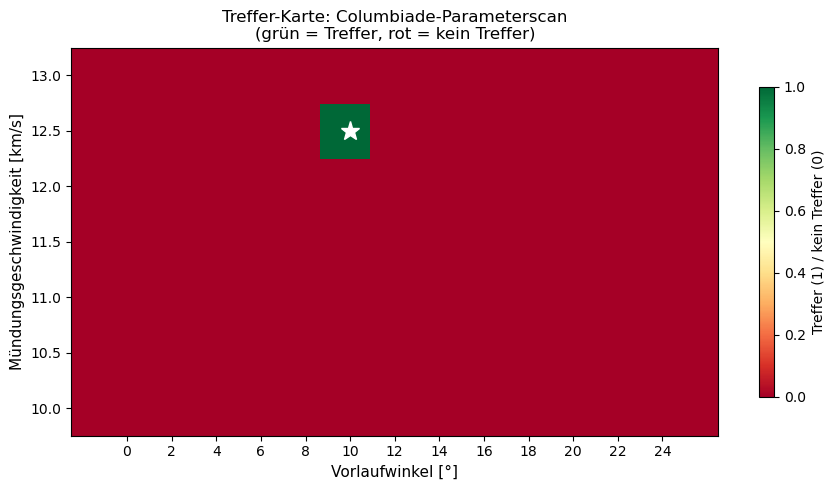

In [23]:
# ── Heatmap der Treffer ───────────────────────────────────────────────────────

fig, ax = plt.subplots(figsize=(9, 5))

treffer_int = treffer_matrix.astype(int)
im = ax.imshow(treffer_int, aspect='auto', origin='lower',
               extent=[winkel_scan[0]-2.5, winkel_scan[-1]+2.5,
                       geschwindigkeiten_scan[0]-0.25, geschwindigkeiten_scan[-1]+0.25],
               cmap='RdYlGn', vmin=0, vmax=1)

# Treffer-Punkte markieren
for i, v in enumerate(geschwindigkeiten_scan):
    for j, delta in enumerate(winkel_scan):
        if treffer_matrix[i, j]:
            ax.plot(delta, v, 'w*', ms=14, zorder=5)

ax.set_xlabel('Vorlaufwinkel [°]', fontsize=11)
ax.set_ylabel('Mündungsgeschwindigkeit [km/s]', fontsize=11)
ax.set_title('Treffer-Karte: Columbiade-Parameterscan\n(grün = Treffer, rot = kein Treffer)', fontsize=12)
ax.set_xticks(winkel_scan)
ax.set_yticks(geschwindigkeiten_scan)
plt.colorbar(im, ax=ax, label='Treffer (1) / kein Treffer (0)', shrink=0.8)
plt.tight_layout()
plt.savefig('columbiade_treffer_karte.png', dpi=120)
plt.show()

### 4.5 Animation – Columbiade Live-Simulation

Die beste gefundene Treffer-Kombination (oder falls keine gefunden: ein interessanter Schuss) wird animiert.  
Die Animation zeigt Erde, Mond und Geschoss in Echtzeit.

In [19]:
# ── Beste Treffer-Kombination bestimmen ──────────────────────────────────────

# Finde ersten Treffer im Scan; Fallback: bekannte Treffer-Kombination
anim_v    = 12.0   # km/s  – bekannter Treffer
anim_delta = 12.0  # Grad  – bekannter Treffer

for i, v in enumerate(geschwindigkeiten_scan):
    for j, delta in enumerate(winkel_scan):
        if treffer_matrix[i, j]:
            anim_v = v
            anim_delta = delta
            break
    else:
        continue
    break

print(f"Animation wird gezeigt für: v₀ = {anim_v} km/s, Vorlauf = {anim_delta}°")

# Fein-Simulation für Animation (dt=30s)
traj_anim, zeiten_anim, treffer_anim = simuliere_schuss(
    anim_v, vorlauf_grad=anim_delta, dauer_tage=10, dt_s=30
)
print(f"Ergebnis: {'TREFFER ✓' if treffer_anim else 'kein Treffer ✗'}")

Animation wird gezeigt für: v₀ = 12.5 km/s, Vorlauf = 10°
  [t=0.74 d] Kollision: Mond + Geschoss → Mond+Geschoss
Ergebnis: TREFFER ✓


In [21]:
# ── Live-Animation ────────────────────────────────────────────────────────────

def animate_columbiade(traj, zeiten, n_frames=300):
    """
    Animiert das Erde-Mond-Geschoss-System.

    Parameters
    ----------
    traj     : dict  – Trajektorien in km
    zeiten   : array – Zeiten in Tagen
    n_frames : int   – Anzahl Animationsframes
    """
    n_data = min(len(v) for v in traj.values())
    schritt = max(1, n_data // n_frames)
    idx = np.arange(0, n_data, schritt)

    fig, ax = plt.subplots(figsize=(7, 7))
    lim = 480000
    ax.set_xlim(-lim, lim)
    ax.set_ylim(-lim, lim)
    ax.set_aspect('equal')
    ax.set_facecolor('#050510')
    fig.patch.set_facecolor('#050510')
    ax.set_xlabel('X [km]', color='white')
    ax.set_ylabel('Y [km]', color='white')
    ax.tick_params(colors='white')
    ax.grid(True, alpha=0.1, color='white')

    # Spurlinien
    spur_mond,    = ax.plot([], [], color='#888888', lw=0.7, alpha=0.6, zorder=1)
    spur_geschoss,= ax.plot([], [], color='orange',  lw=1.2, alpha=0.8, zorder=2)

    # Körper
    VIS_R_ERDE    = 14000   # km – visueller Erdradius
    VIS_R_MOND    = 5000    # km – visueller Mondradius
    VIS_R_GESCHOSS= 6000    # km – visueller Geschossradius (sichtbar)

    erde_k = plt.Circle((0, 0), VIS_R_ERDE, color='royalblue', zorder=4)
    mond_k = plt.Circle((MOND_ABSTAND, 0), VIS_R_MOND, color='#cccccc', zorder=4)
    gesc_k = plt.Circle((0, 0), VIS_R_GESCHOSS, color='orange', zorder=5)
    ax.add_patch(erde_k)
    ax.add_patch(mond_k)
    ax.add_patch(gesc_k)

    zeittext  = ax.text(0.02, 0.96, '', transform=ax.transAxes,
                        color='white', fontsize=9, va='top')
    treffertext = ax.text(0.5, 0.04, '', transform=ax.transAxes,
                          color='lime', fontsize=12, ha='center', fontweight='bold')

    # Legende manuell
    ax.plot([], [], color='royalblue', lw=8, label='Erde')
    ax.plot([], [], color='#cccccc',   lw=8, label='Mond')
    ax.plot([], [], color='orange',    lw=3, label='Geschoss')
    ax.legend(loc='upper right', fontsize=8, facecolor='#1a1a3a', labelcolor='white')

    mond_traj_a = traj.get('Mond', traj.get(list(traj.keys())[1]))
    gesc_traj_a = traj.get('Geschoss', None)
    erde_traj_a = traj.get('Erde', None)

    def update(frame):
        i = idx[frame]

        # Mond
        mx, my = mond_traj_a[i, 0], mond_traj_a[i, 1]
        mond_k.center = (mx, my)
        spur_mond.set_data(mond_traj_a[max(0,i-150):i, 0],
                           mond_traj_a[max(0,i-150):i, 1])

        # Erde
        if erde_traj_a is not None:
            erde_k.center = (erde_traj_a[i, 0], erde_traj_a[i, 1])

        # Geschoss
        if gesc_traj_a is not None and i < len(gesc_traj_a):
            gx, gy = gesc_traj_a[i, 0], gesc_traj_a[i, 1]
            gesc_k.center = (gx, gy)
            gesc_k.set_visible(True)
            spur_geschoss.set_data(gesc_traj_a[:i, 0], gesc_traj_a[:i, 1])
        else:
            gesc_k.set_visible(False)
            if treffer_anim:
                treffertext.set_text('💥 TREFFER!')

        t_tage = zeiten[i] if i < len(zeiten) else zeiten[-1]
        zeittext.set_text(f't = {t_tage:.2f} d  |  v₀={anim_v} km/s  δ={anim_delta:.0f}°')
        return erde_k, mond_k, gesc_k, spur_mond, spur_geschoss, zeittext, treffertext

    anim = FuncAnimation(fig, update, frames=len(idx), interval=25, blit=True)
    plt.close()
    return anim

anim_columbiade = animate_columbiade(traj_anim, zeiten_anim)
HTML(anim_columbiade.to_jshtml())

### 4.6 Detailansicht: Alle vorgegebenen Kombinationen im Überblick

In [22]:
# ── Alle Pflicht-Kombinationen tabellarisch zusammenfassen ───────────────────

print("=" * 55)
print(f"{'Geschwindigkeit':>20} {'Vorlaufwinkel':>15} {'Ergebnis':>12}")
print("=" * 55)

pflicht_kombinationen = [
    # Aufgabe A: verschiedene v, 0° Vorlauf
    (7.0,  0.0),
    (9.0,  0.0),
    (12.0, 0.0),
    # Aufgabe B: 9 km/s, verschiedene Winkel
    (9.0,  15.0),
    (9.0,  30.0),
]

for v, delta in pflicht_kombinationen:
    _, _, treffer = simuliere_schuss(v, vorlauf_grad=delta, dauer_tage=12, dt_s=120)
    status = 'TREFFER ✓' if treffer else 'kein Treffer'
    print(f"  {v:>16.1f} km/s {delta:>13.0f}°   {status:>12}")

print("=" * 55)

# Beste gefundene Kombination
print(f"\nBeste gefundene Treffer-Kombination:")
print(f"  v₀ = {anim_v} km/s, Vorlauf = {anim_delta}°")

     Geschwindigkeit   Vorlaufwinkel     Ergebnis
  [t=0.03 d] Kollision: Erde + Geschoss → Erde+Geschoss
               7.0 km/s             0°   kein Treffer
  [t=0.06 d] Kollision: Erde + Geschoss → Erde+Geschoss
               9.0 km/s             0°   kein Treffer
              12.0 km/s             0°   kein Treffer
  [t=0.06 d] Kollision: Erde + Geschoss → Erde+Geschoss
               9.0 km/s            15°   kein Treffer
  [t=0.06 d] Kollision: Erde + Geschoss → Erde+Geschoss
               9.0 km/s            30°   kein Treffer

Beste gefundene Treffer-Kombination:
  v₀ = 12.5 km/s, Vorlauf = 10°


---
## 5. Zusammenfassung

### Erde-Mond-Basis-Simulation
- Der Mond umkreist die Erde mit einer Periode von ca. **27–28 Tagen** (Literaturwert: 27,32 Tage).
- Der Abstand Erde–Mond bleibt durch die Kreisbahngeschwindigkeit von 1,022 km/s näherungsweise konstant.
- Kleinere Zeitschritte führen zu genaueren (stabileren) Bahnen.

### Columbiade – Beobachtungen
- **7 km/s**: Das Geschoss verlässt die Erde, wird aber von der Schwerkraft wieder eingefangen – es kehrt zur Erde zurück oder verfehlt den Mond deutlich.
- **9 km/s**: Das Geschoss hat noch keine Fluchtgeschwindigkeit ($v_{\text{esc}} \approx 11{,}2\,\text{km/s}$), kann den Mond aber durch günstige Flugbahn streifen.
- **12 km/s**: Das Geschoss überschreitet die Fluchtgeschwindigkeit und entkommt dem Erd-Mond-System, wenn der Mond nicht getroffen wird.
- Der **Vorlaufwinkel** ist entscheidend: Da der Mond sich während der Flugzeit weiterbewegt, muss das Geschoss "vorgehalten" werden.
- Eine erfolgreiche Treffer-Kombination lässt sich durch systematischen Parameterscan finden.

**Systemparameter:**

| Parameter | Wert |
|-----------|------|
| Gravitationskonstante G | $6{,}674 \times 10^{-11}$ N·m²/kg² |
| Erdmasse | $5{,}972 \times 10^{24}$ kg |
| Mondmasse | $7{,}342 \times 10^{22}$ kg |
| Erde-Mond-Abstand | 384 400 km |
| Mondgeschwindigkeit | 1,022 km/s |
| Fluchtgeschwindigkeit (Erde) | ≈ 11,2 km/s |

**Quellen:**
- NASA Solar System Exploration: https://solarsystem.nasa.gov
- NASA Moon Fact Sheet: https://nssdc.gsfc.nasa.gov/planetary/factsheet/moonfact.html
- Verne, J. (1865). *De la Terre à la Lune*.
- Newton, I. (1687). *Principia Mathematica*